# 1. Importing necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.graph_objs as go
import plotly
import plotly.express as px
plotly.offline.init_notebook_mode()
import pickle 
import json

# 2. Loading the data

In [2]:
df = pd.read_csv("Credit Card_Clustering.csv")
df.shape

(8950, 18)

👉 The data set contains details of 8,950 credit card holders.

# 3. EDA 🔍

In [3]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

👉 There are **18 variables** in this data set:
*   **1 categorical** variable (CUST_ID),
*   **14 continuous** variables,
*    **3 discrete numerical** variables

In [6]:
df.isna().mean()*100

CUST_ID                             0.000000
BALANCE                             0.000000
BALANCE_FREQUENCY                   0.000000
PURCHASES                           0.000000
ONEOFF_PURCHASES                    0.000000
INSTALLMENTS_PURCHASES              0.000000
CASH_ADVANCE                        0.000000
PURCHASES_FREQUENCY                 0.000000
ONEOFF_PURCHASES_FREQUENCY          0.000000
PURCHASES_INSTALLMENTS_FREQUENCY    0.000000
CASH_ADVANCE_FREQUENCY              0.000000
CASH_ADVANCE_TRX                    0.000000
PURCHASES_TRX                       0.000000
CREDIT_LIMIT                        0.011173
PAYMENTS                            0.000000
MINIMUM_PAYMENTS                    3.497207
PRC_FULL_PAYMENT                    0.000000
TENURE                              0.000000
dtype: float64

👉 CREDIT_LIMIT has 0.011173% missing values and MINIMUM_PAYMENTS has 3.497207% missing values. 

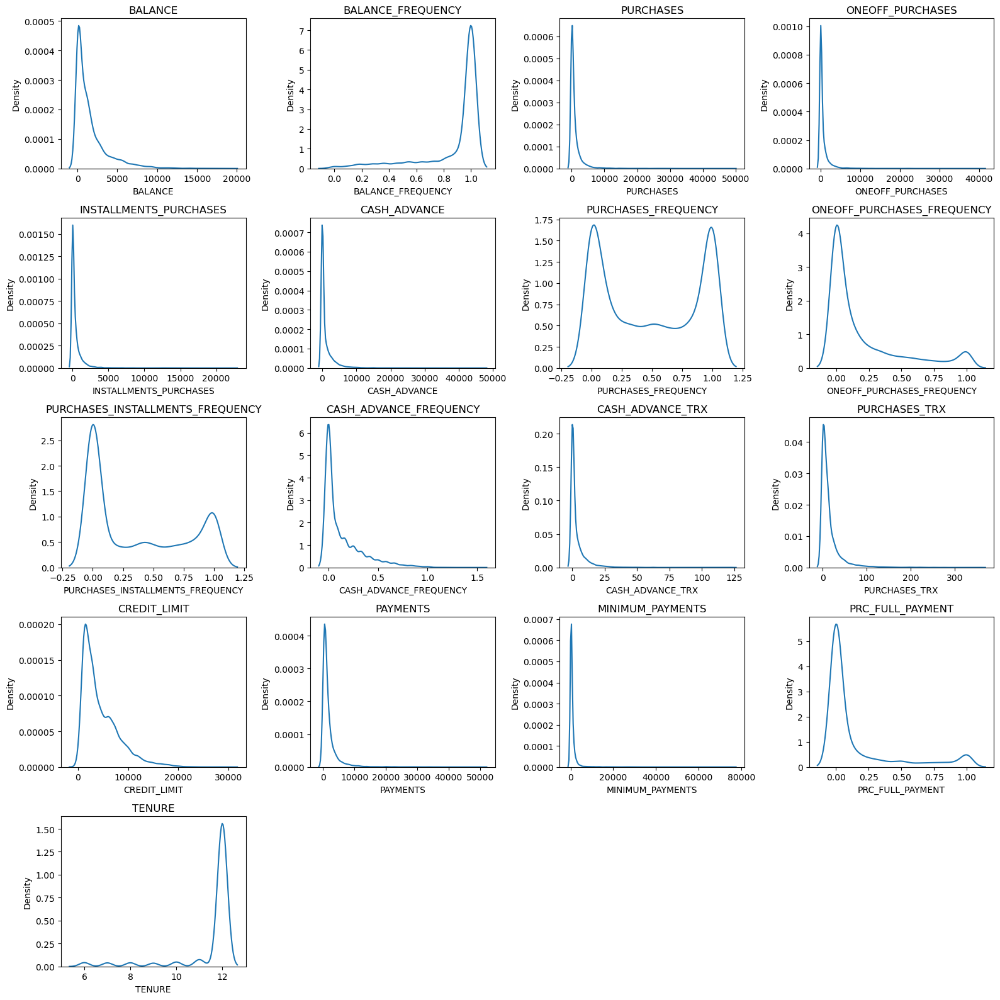

In [7]:
cont_num_cols = df.select_dtypes(include='number').columns
plt.figure(figsize=(16,16))
for i, col in enumerate(cont_num_cols, 1):
    plt.subplot(5, 4, i)
    sns.kdeplot(x=df[col])
    plt.title(col)

plt.tight_layout()
plt.show()

👉 The dataset shows varied skewness, expected due to a few customers with high transaction amounts. 

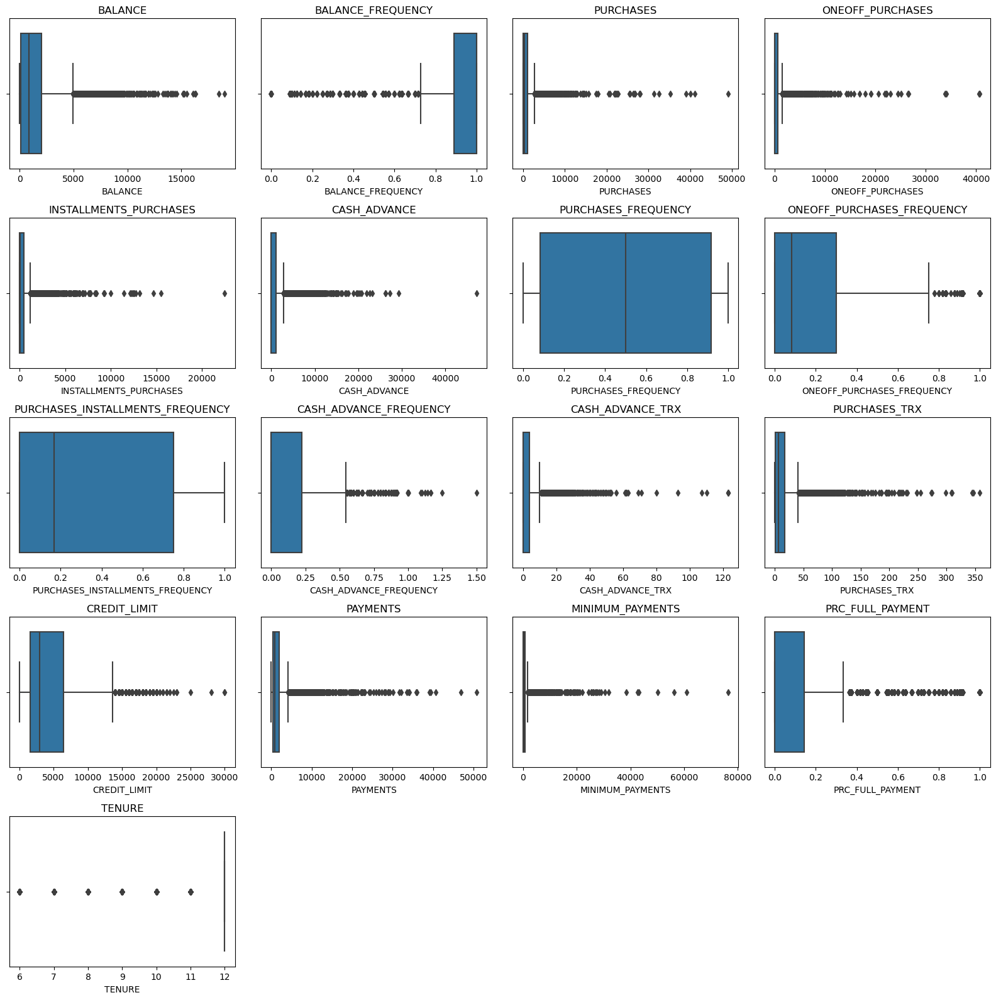

In [8]:
cont_num_cols = df.select_dtypes(include='number').columns
plt.figure(figsize=(16,16))
for i, col in enumerate(cont_num_cols, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(x=df[col])
    plt.title(col)

plt.tight_layout()
plt.show()

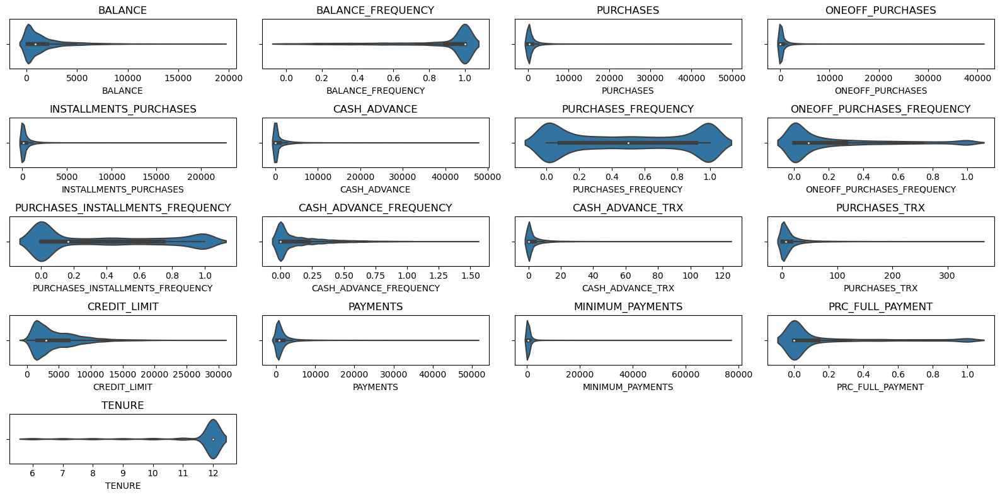

In [9]:
plt.figure(figsize=(16,8))
for i, col in enumerate(cont_num_cols, 1):
    plt.subplot(5, 4, i)
    sns.violinplot(x=df[col])
    plt.title(col)

plt.tight_layout()
plt.show()

In [10]:
corr_matrix=df.corr()
corr_matrix.style.background_gradient(cmap='coolwarm')

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.322412,0.181261,0.164350,0.126469,0.496692,-0.077944,0.073166,-0.063186,0.449218,0.385152,0.154338,0.531283,0.322802,0.398684,-0.318959,0.072692
BALANCE_FREQUENCY,0.322412,1.000000,0.133674,0.104323,0.124292,0.099388,0.229715,0.202415,0.176079,0.191873,0.141555,0.189626,0.095843,0.065008,0.132569,-0.095082,0.119776
PURCHASES,0.181261,0.133674,1.000000,0.916845,0.679896,-0.051474,0.393017,0.498430,0.315567,-0.120143,-0.067175,0.689561,0.356963,0.603264,0.093860,0.180379,0.086288
ONEOFF_PURCHASES,0.164350,0.104323,0.916845,1.000000,0.330622,-0.031326,0.264937,0.524891,0.127729,-0.082628,-0.046212,0.545523,0.319724,0.567292,0.048755,0.132763,0.064150
INSTALLMENTS_PURCHASES,0.126469,0.124292,0.679896,0.330622,1.000000,-0.064244,0.442418,0.214042,0.511351,-0.132318,-0.073999,0.628108,0.256499,0.384084,0.132172,0.182569,0.086143
CASH_ADVANCE,0.496692,0.099388,-0.051474,-0.031326,-0.064244,1.000000,-0.215507,-0.086754,-0.177070,0.628522,0.656498,-0.075850,0.303985,0.453238,0.140107,-0.152935,-0.068312
PURCHASES_FREQUENCY,-0.077944,0.229715,0.393017,0.264937,0.442418,-0.215507,1.000000,0.501343,0.862934,-0.308478,-0.203478,0.568430,0.119788,0.103464,0.003030,0.305802,0.061506
ONEOFF_PURCHASES_FREQUENCY,0.073166,0.202415,0.498430,0.524891,0.214042,-0.086754,0.501343,1.000000,0.142329,-0.111716,-0.069088,0.544869,0.295038,0.243537,-0.030327,0.157531,0.082466
PURCHASES_INSTALLMENTS_FREQUENCY,-0.063186,0.176079,0.315567,0.127729,0.511351,-0.177070,0.862934,0.142329,1.000000,-0.262958,-0.169207,0.529975,0.060755,0.085551,0.030073,0.250087,0.073275
CASH_ADVANCE_FREQUENCY,0.449218,0.191873,-0.120143,-0.082628,-0.132318,0.628522,-0.308478,-0.111716,-0.262958,1.000000,0.799561,-0.131168,0.132616,0.183192,0.098838,-0.249773,-0.133372


Based on the correlation matrix, here are some pairs with strong correlations (absolute value above 0.6) suggesting potential multicollinearity issues.

* PURCHASES and ONEOFF_PURCHASES: 0.916845
* PURCHASES and PURCHASES_TRX: 0.689561
* ONEOFF_PURCHASES and PURCHASES_TRX: 0.545523
* INSTALLMENTS_PURCHASES and PURCHASES_TRX: 0.628108
* PURCHASES_FREQUENCY and PURCHASES_INSTALLMENTS_FREQUENCY: 0.862934
* CASH_ADVANCE and CASH_ADVANCE_FREQUENCY: 0.628522
* CASH_ADVANCE_FREQUENCY and CASH_ADVANCE_TRX: 0.799561

# 4. Data Preprocessing

Customer ID is unique and won't affect clustering. With only 0.01% of CREDIT_LIMIT records having NaN values (just one record), we can drop it without concern. For MINIMUM_PAYMENTS, we can use the median to replace NaN values due to their random nature and the skewed distribution of this feature.

In [11]:
df_new=df.copy()

In [12]:
df_new.drop(['CUST_ID'], axis=1, inplace=True)
df_new['CREDIT_LIMIT'].fillna(df_new['CREDIT_LIMIT'].median(), inplace=True)
df_new['MINIMUM_PAYMENTS'].fillna(df_new['MINIMUM_PAYMENTS'].median(), inplace=True)

## 4.1 Feature Engineering

In [13]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

In [14]:
df_new.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [15]:
unbounded_cols = []
for col in df_new.select_dtypes(include=['float', 'int']):
    min_val = df_new[col].min()
    max_val = df_new[col].max()
    if min_val == float('-inf') or max_val == float('inf'):
        unbounded_cols.append(col)
    elif min_val < 0 or max_val > 12: 
        unbounded_cols.append(col)

print("Unbounded columns:", unbounded_cols)

Unbounded columns: ['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS']


Since the above columns are not bounded, log transformation will be applied to reduce skewness and normalize their distributions. This transformation aims to enhance the performance of clustering algorithms and improve data interpretability.

In [16]:
for col in unbounded_cols:
    df_new[col] = np.log(1 + df_new[col])

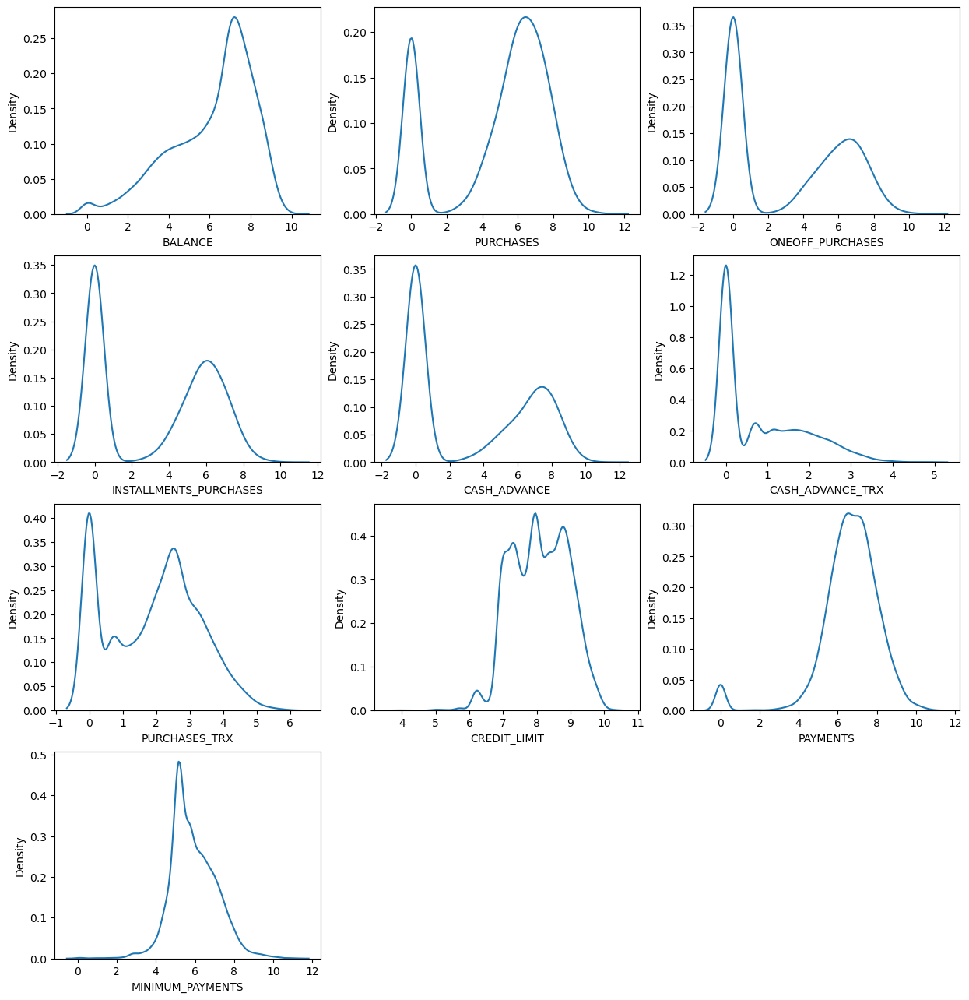

In [17]:
plt.figure(figsize=(15,20))
for i, col in enumerate(unbounded_cols):
    ax = plt.subplot(5, 3, i+1)
    sns.kdeplot(df_new[col], ax=ax)
plt.show()

In [18]:
corr_matrix=df_new.corr()
corr_matrix.style.background_gradient(cmap='coolwarm')

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.652592,-0.074977,0.180434,-0.110924,0.521648,-0.093945,0.146987,-0.107077,0.451885,0.504146,-0.017178,0.299822,0.429075,0.762724,-0.408913,0.073873
BALANCE_FREQUENCY,0.652592,1.000000,0.096993,0.140453,0.112687,0.164510,0.229715,0.202415,0.176079,0.191873,0.193654,0.200958,0.095060,0.322262,0.419343,-0.095082,0.119776
PURCHASES,-0.074977,0.096993,1.000000,0.683510,0.685390,-0.496556,0.781750,0.547315,0.592411,-0.349000,-0.416668,0.888988,0.187693,0.206779,-0.050899,0.251738,0.106368
ONEOFF_PURCHASES,0.180434,0.140453,0.683510,1.000000,0.161434,-0.190146,0.373634,0.769934,0.092781,-0.116687,-0.144803,0.574393,0.284852,0.267027,0.059035,0.043285,0.091953
INSTALLMENTS_PURCHASES,-0.110924,0.112687,0.685390,0.161434,1.000000,-0.394318,0.794784,0.189930,0.878672,-0.288378,-0.335621,0.782683,0.106577,0.165432,-0.038362,0.274441,0.099394
CASH_ADVANCE,0.521648,0.164510,-0.496556,-0.190146,-0.394318,1.000000,-0.432610,-0.181973,-0.356494,0.770260,0.898398,-0.430773,0.119428,0.182519,0.407316,-0.322740,-0.100459
PURCHASES_FREQUENCY,-0.093945,0.229715,0.781750,0.373634,0.794784,-0.432610,1.000000,0.501343,0.862934,-0.308478,-0.367151,0.909024,0.112644,0.175997,-0.052618,0.305802,0.061506
ONEOFF_PURCHASES_FREQUENCY,0.146987,0.202415,0.547315,0.769934,0.189930,-0.181973,0.501343,1.000000,0.142329,-0.111716,-0.146183,0.608430,0.288059,0.271411,0.036576,0.157531,0.082466
PURCHASES_INSTALLMENTS_FREQUENCY,-0.107077,0.176079,0.592411,0.092781,0.878672,-0.356494,0.862934,0.142329,1.000000,-0.262958,-0.305455,0.759533,0.052570,0.132684,-0.032191,0.250087,0.073275
CASH_ADVANCE_FREQUENCY,0.451885,0.191873,-0.349000,-0.116687,-0.288378,0.770260,-0.308478,-0.111716,-0.262958,1.000000,0.912540,-0.302996,0.139848,0.193640,0.360829,-0.249773,-0.133372


We've identified correlated features and plan to address them through dimensionality reduction using PCA. PCA finds new axes that maximize variance in the data, sequentially selecting components that explain the most variance.

## 4.2 Principal Component Analysis

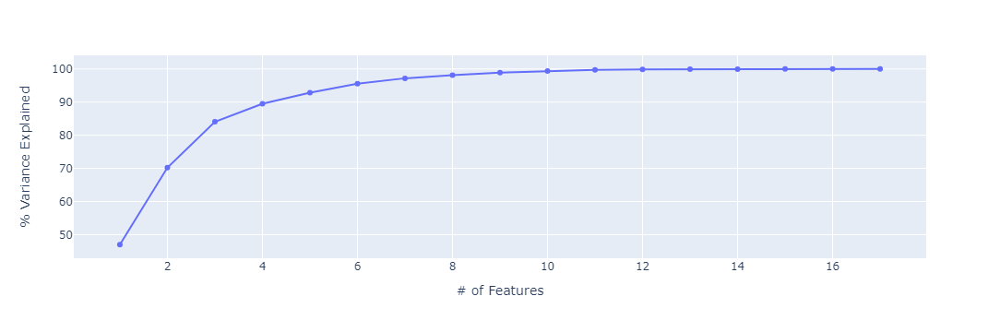

In [19]:
df_model=df_new.copy()
pca_all = PCA(n_components=len(df_model.columns), random_state = 42)
pca_all.fit(df_model)
variance = pca_all.explained_variance_ratio_
var = np.cumsum(variance)*100
fig = px.line(x=np.arange(len(df_model.columns))+1, y=var, markers=True)
fig.update_xaxes(title_text='# of Features')
fig.update_yaxes(title_text='% Variance Explained')
fig.update_layout(width=900)
fig.show()

In [20]:
print('information extracted from 6 varibles is {} %'.format(np.sum(variance[:6])*100/np.sum(variance)))
print('information extracted from 8 varibles is {} %'.format(np.sum(variance[:8])*100/np.sum(variance)))
print('information extracted from 10 varibles is {} %'.format(np.sum(variance[:10])*100/np.sum(variance)))

information extracted from 6 varibles is 95.53182548829759 %
information extracted from 8 varibles is 98.14455932095103 %
information extracted from 10 varibles is 99.37964796807428 %


In [21]:
pca = PCA(n_components=4)
X_pca = pca.fit_transform(df_model)

# 5. Model Training

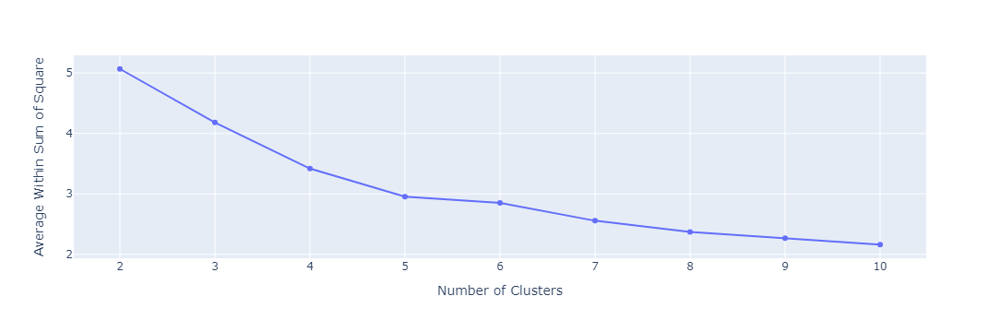

In [22]:
from scipy.spatial.distance import cdist, pdist
avg_withinSS = []
number_of_cluster = range(2,11)
for i in number_of_cluster:
    kmeans = KMeans(n_clusters=i, random_state = 42)
    kmeans.fit(X_pca)
    centroids = kmeans.cluster_centers_

    D_k = cdist(X_pca, centroids, 'euclidean')
    cIdx = np.argmin(D_k, axis=1)
    dist = np.min(D_k, axis=1)
    avg_withinSS.append(sum(dist)/X_pca.shape[0])


fig = px.line(x=number_of_cluster, y=avg_withinSS, markers=True)
fig.update_xaxes(title_text='Number of Clusters')
fig.update_yaxes(title_text='Average Within Sum of Square')
fig.update_layout(width=900)

At first glance we can segment with 5 or 6 clusters because it is the most significant decrease, this method is very objective so it will use our perspective by also comparing it with other metrics.

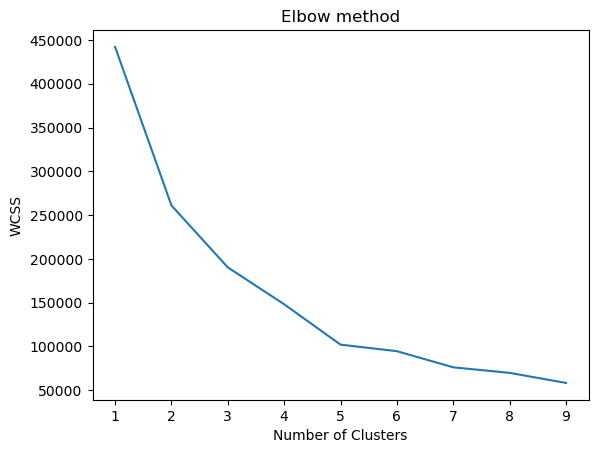

In [23]:
kmeans_models = [KMeans(n_clusters=k, random_state=23).fit(X_pca) for k in range (1, 10)]
innertia = [model.inertia_ for model in kmeans_models]

plt.plot(range(1, 10), innertia)
plt.title('Elbow method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

It seems like the elbow is around 5. We will use silhouette score to see which one performs better.

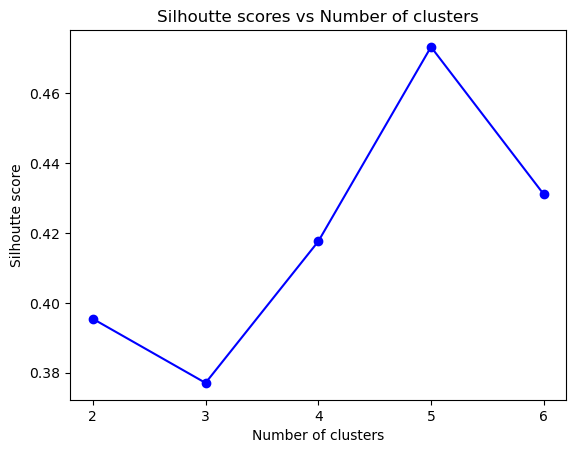

In [24]:
from sklearn.metrics import silhouette_score

silhoutte_scores = [silhouette_score(X_pca, model.labels_) for model in kmeans_models[1:6]]
plt.plot(range(2,7), silhoutte_scores, "bo-")
plt.xticks([2, 3, 4, 5, 6])
plt.title('Silhoutte scores vs Number of clusters')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte score')
plt.show()

n=5 seems to have a higher silhouette than others. 

In [25]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    score = silhouette_score(X, labels)
    return score
param_grid = {
    'n_clusters': [2, 3, 4, 5],  
    'max_iter': [200, 300, 500, 1000], 
    'tol': [0.1, 0.01, 1e-4, 1e-5, 1e-6],  
}
kmeans = KMeans(init ='k-means++', random_state=42)
grid_search = GridSearchCV(estimator=kmeans, param_grid=param_grid, cv=5, scoring=silhouette_scorer)
grid_search.fit(X_pca)
best_params=grid_search.best_params_
print("Best Parameters:", best_params)
print("Best Silhouette Score:", grid_search.best_score_)

Best Parameters: {'max_iter': 200, 'n_clusters': 5, 'tol': 0.0001}
Best Silhouette Score: 0.4701297652153489


# 6. Model Evaluation and Inference.

## 6.1 Cluster Visualization (2D)

In [26]:
kmeans = KMeans(**best_params, random_state=42)
kmeans.fit(X_pca)
print('Silhoutte score of our model is ' + str(silhouette_score(X_pca, kmeans.labels_)))

Silhoutte score of our model is 0.47339638753815777


Assigning labels as cluster index to our dataset.

In [27]:
df['cluster_id'] = kmeans.labels_

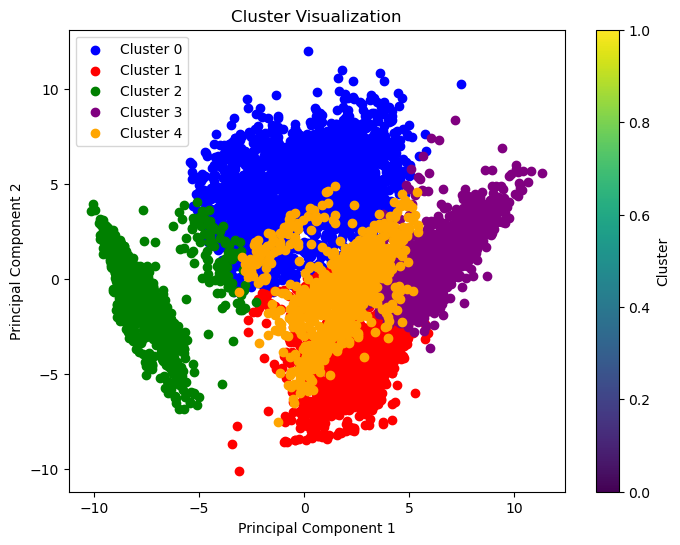

In [28]:
colors = ['blue', 'red', 'green', 'purple', 'orange'] 
plt.figure(figsize=(8, 6))
for cluster in range(max(df['cluster_id']) + 1):
    plt.scatter(X_pca[df['cluster_id'] == cluster, 0], X_pca[df['cluster_id'] == cluster, 1], 
                color=colors[cluster], label=f'Cluster {cluster}')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Cluster Visualization')
plt.legend()
plt.colorbar(label='Cluster')
plt.show()

## 6.2 3D plot:

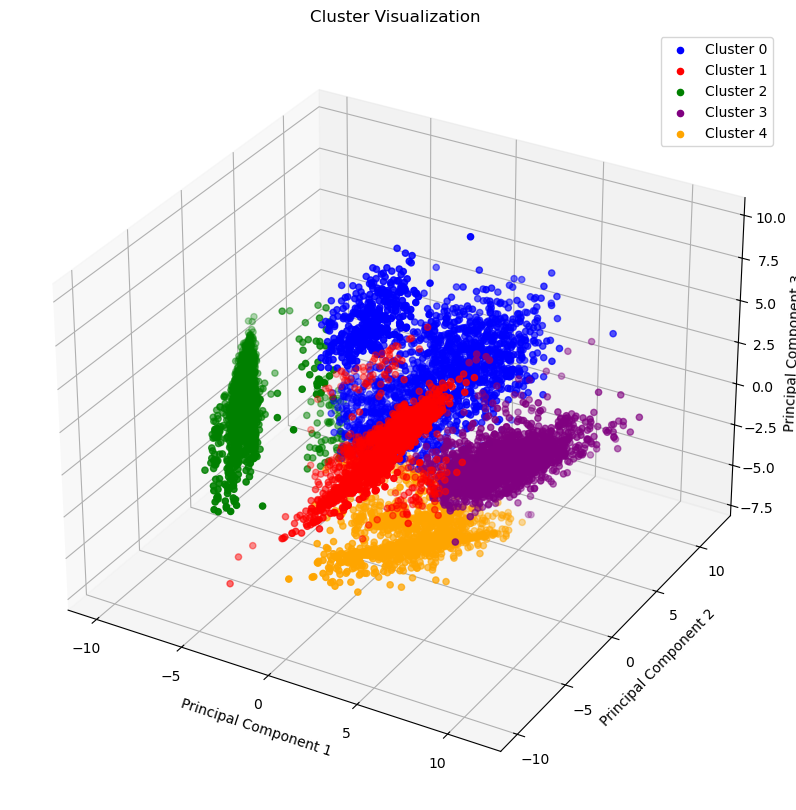

In [29]:
colors = ['blue', 'red', 'green', 'purple', 'orange']
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
for cluster in range(max(df['cluster_id']) + 1):
    ax.scatter(X_pca[df['cluster_id'] == cluster, 0], 
               X_pca[df['cluster_id'] == cluster, 1], 
               X_pca[df['cluster_id'] == cluster, 2], 
               color=colors[cluster], label=f'Cluster {cluster}')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('Cluster Visualization')
ax.legend()
plt.show()

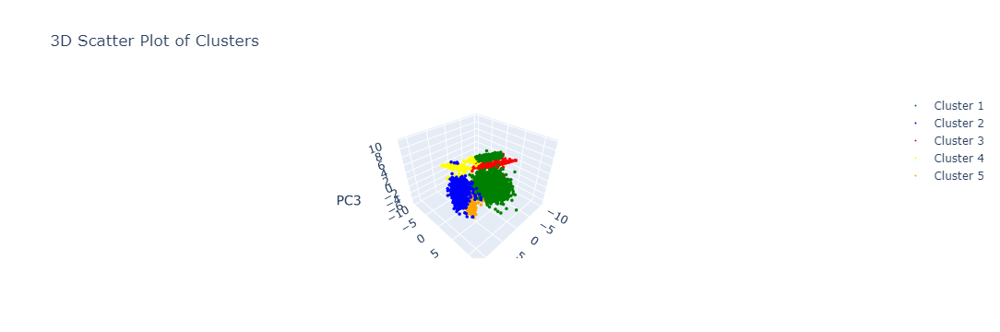

In [30]:
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()
km_clt= KMeans(n_clusters = 5, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 3)
clusters = km_clt.fit_predict(X_pca)
X_pca = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(4)])
df_cluster = X_pca.copy()
if len(clusters) == df_cluster.shape[0]:
    df_cluster['Clusters'] = clusters
else:
    raise ValueError("Mismatch in the number of rows between df_cluster and clusters")
df_cluster['Clusters']= clusters
pca = PCA(n_components=3) 
X_pca = pca.fit_transform(X_pca)
X_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2', 'PC3'])

kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(X_pca)

X_pca['Clusters'] = clusters
cluster1=df_cluster.loc[df_cluster['Clusters'] == 0]
cluster2=df_cluster.loc[df_cluster['Clusters'] == 1]
cluster3=df_cluster.loc[df_cluster['Clusters'] == 2]
cluster4=df_cluster.loc[df_cluster['Clusters'] == 3]
cluster5=df_cluster.loc[df_cluster['Clusters'] == 4]
scatter1 = go.Scatter3d(
    mode='markers',
    name='Cluster 1',
    x=cluster1['PC1'],
    y=cluster1['PC2'],
    z=cluster1['PC3'],
    marker=dict(size=2, color='green')
)
scatter2 = go.Scatter3d(
    mode='markers',
    name='Cluster 2',
    x=cluster2['PC1'],
    y=cluster2['PC2'],
    z=cluster2['PC3'],
    marker=dict(size=2, color='blue')
)
scatter3 = go.Scatter3d(
    mode='markers',
    name='Cluster 3',
    x=cluster3['PC1'],
    y=cluster3['PC2'],
    z=cluster3['PC3'],
    marker=dict(size=2, color='red')
)
scatter4 = go.Scatter3d(
    mode='markers',
    name='Cluster 4',
    x=cluster4['PC1'],
    y=cluster4['PC2'],
    z=cluster4['PC3'],
    marker=dict(size=2, color='yellow')
)
scatter5 = go.Scatter3d(
    mode='markers',
    name='Cluster 5',
    x=cluster5['PC1'],
    y=cluster5['PC2'],
    z=cluster5['PC3'],
    marker=dict(size=2, color='orange')
)

layout = go.Layout(
    title='3D Scatter Plot of Clusters',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    )
)

fig = go.Figure(data=[scatter1, scatter2, scatter3, scatter4, scatter5], layout=layout)
fig.show()

In [31]:
df_cluster.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'Clusters'], dtype='object')

## 6.3. Cluster Analysis

In [32]:
cluster_0 = df[df['cluster_id'] == 0]
cluster_1 = df[df['cluster_id'] == 1]
cluster_2 = df[df['cluster_id'] == 2]
cluster_3 = df[df['cluster_id'] == 3]
cluster_4 = df[df['cluster_id'] == 4]

In [33]:
need_columns = ['BALANCE', 'PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']
d={}
for i in need_columns:  
    d[i] = pd.DataFrame(df.groupby('cluster_id', axis = 0)[i].describe()[['mean', '50%', 'min', 'max']])

pd.concat(d, axis =1)

BALANCE                                         PURCHASES  \
                   mean          50%        min          max         mean   
cluster_id                                                                  
0           2831.917900  2009.565102  19.125876  16304.88925  1272.758950   
1            382.621173    56.375895   0.000000  11416.64736   500.880363   
2           2130.751143  1438.007828   0.000000  14581.45914     1.613040   
3           1315.946408   598.733961   0.000000  19043.13856  2714.540599   
4            750.550640   256.873385   0.000000  12323.84536   816.201361   

                                       CASH_ADVANCE                          \
                 50%     min       max         mean          50%        min   
cluster_id                                                                    
0            667.195   44.70  49039.57  2281.813757  1406.214420  14.222216   
1            316.490    0.01  12375.00     6.142557     0.000000   0.000000   
2              0.000    0.00    100.00  1970.127929  1188.169271   0.000000   
3           1697.085  118.72  41050.40     1.613211     0.000000   0.000000   
4            411.315    4.99  17945.00    12.001511     0.000000   0.000000   

                         CREDIT_LIMIT                             PAYMENTS  \
                     max         mean     50%    min      max         mean   
cluster_id                                                                   
0           47137.211760  5384.980279  4500.0  300.0  30000.0  2574.286530   
1             879.373487  3098.866761  2500.0  300.0  21500.0   725.110741   
2           26194.049540  4005.925110  3000.0   50.0  19000.0  1653.434745   
3             469.074937  5862.987798  5000.0  300.0  30000.0  2475.035657   
4             900.547414  4296.852956  3000.0  150.0  25000.0  1124.213951   

                                           
                    50%  min          max  
cluster_id                                 
0           1489.557836  0.0  46930.59824  
1            418.154012  0.0  28988.97388  
2            751.026114  0.0  34107.07499  
3           1457.368405  0.0  36066.75068  
4            554.091044  0.0  50721.48336

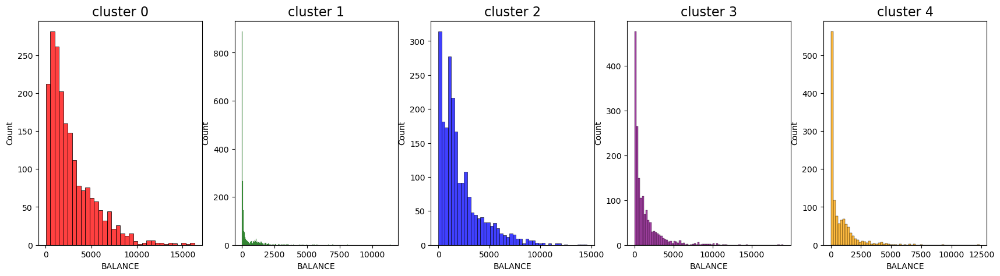

In [34]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['BALANCE'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['BALANCE'], color='green' )
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['BALANCE'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['BALANCE'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['BALANCE'], color='orange')
plt.title('cluster 4', size = 16)
plt.show()

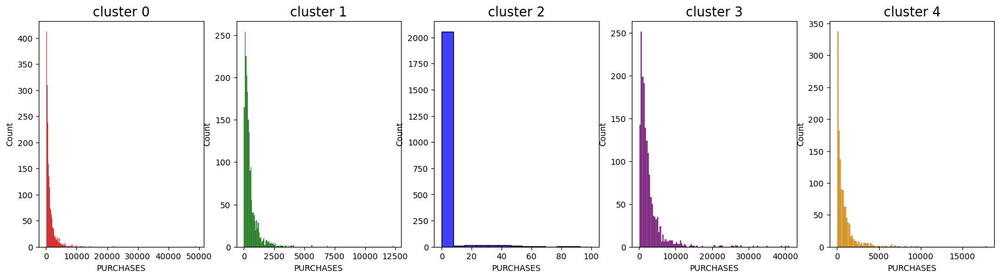

In [35]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['PURCHASES'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['PURCHASES'], color='green' )
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['PURCHASES'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['PURCHASES'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['PURCHASES'], color='orange')
plt.title('cluster 4', size = 16)
plt.show()

Text(0.5, 1.0, 'Purchases Persentage')

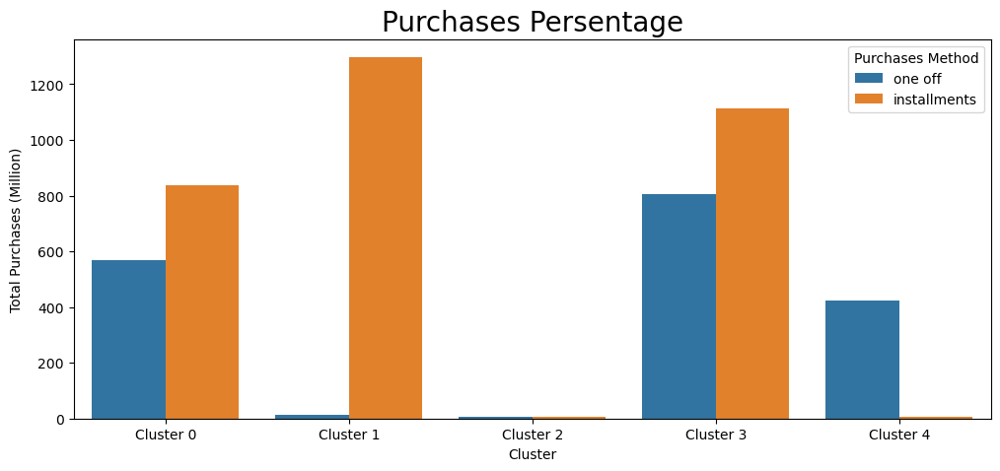

In [36]:
plt.figure(figsize=(12,5))
ax = pd.DataFrame({'Cluster' : ['Cluster 0', 'Cluster 0', 'Cluster 1', 'Cluster 1', 'Cluster 2', 'Cluster 2', 'Cluster 3', 'Cluster 3', 'Cluster 4', 'Cluster 4'],
                    'Purchases' : [cluster_0['ONEOFF_PURCHASES_FREQUENCY'].sum(), 
                                   cluster_0['PURCHASES_INSTALLMENTS_FREQUENCY'].sum(),
                                   cluster_1['ONEOFF_PURCHASES_FREQUENCY'].sum(), 
                                   cluster_1['PURCHASES_INSTALLMENTS_FREQUENCY'].sum(),
                                   cluster_2['ONEOFF_PURCHASES_FREQUENCY'].sum(), 
                                   cluster_2['PURCHASES_INSTALLMENTS_FREQUENCY'].sum(),
                                   cluster_3['ONEOFF_PURCHASES_FREQUENCY'].sum(), 
                                   cluster_3['PURCHASES_INSTALLMENTS_FREQUENCY'].sum(), 
                                   cluster_4['ONEOFF_PURCHASES_FREQUENCY'].sum(), 
                                   cluster_4['PURCHASES_INSTALLMENTS_FREQUENCY'].sum()],
                    'Purchases Method' : ['one off', 'installments', 'one off', 'installments', 'one off', 'installments', 'one off', 'installments', 'one off', 'installments']})
sns.barplot(x='Cluster', y='Purchases', data=ax, hue = 'Purchases Method' )
plt.ylabel('Total Purchases (Million)')
plt.xlabel('Cluster')
plt.title('Purchases Persentage', size = 20)

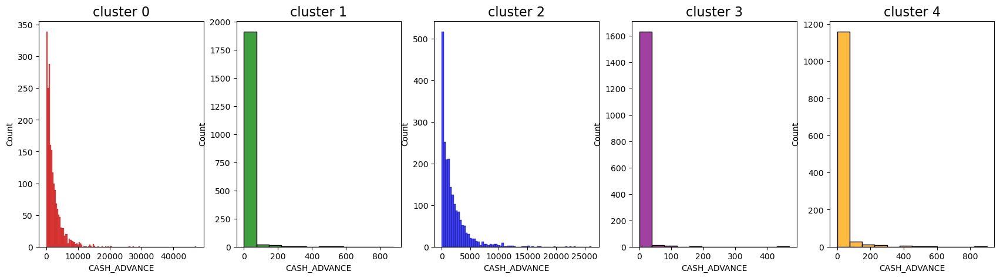

In [37]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['CASH_ADVANCE'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['CASH_ADVANCE'], color='green' )
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['CASH_ADVANCE'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['CASH_ADVANCE'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['CASH_ADVANCE'], color='orange')
plt.title('cluster 4', size = 16)
plt.show()

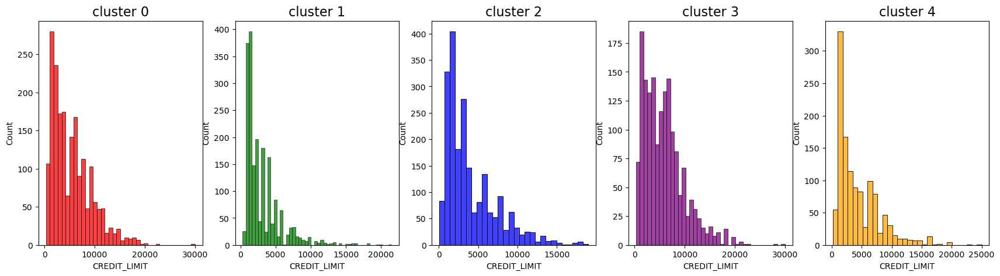

In [38]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['CREDIT_LIMIT'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['CREDIT_LIMIT'], color='green' )
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['CREDIT_LIMIT'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['CREDIT_LIMIT'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['CREDIT_LIMIT'], color='orange')
plt.title('cluster 4', size = 16)
plt.show()

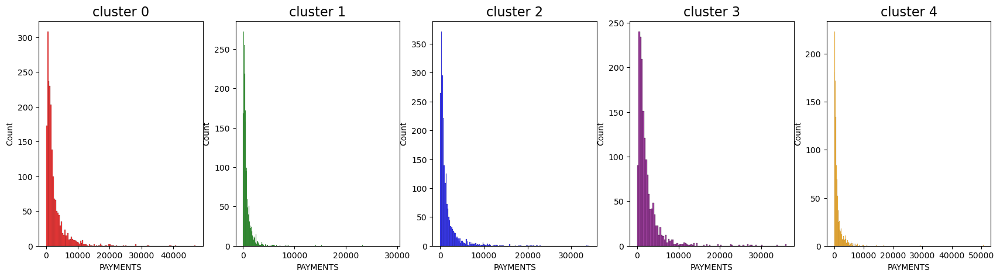

In [39]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['PAYMENTS'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['PAYMENTS'], color='green' )
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['PAYMENTS'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['PAYMENTS'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['PAYMENTS'], color='orange')
plt.title('cluster 4', size = 16)
plt.show()

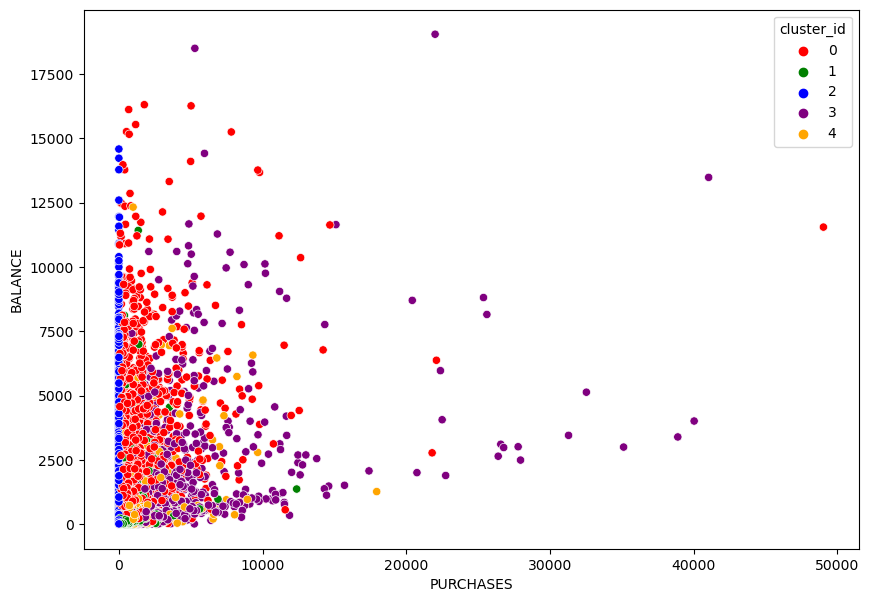

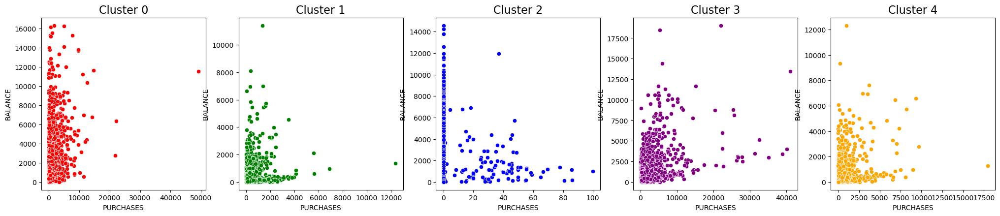

In [40]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='PURCHASES', y='BALANCE', hue='cluster_id', palette=['red', 'green', 'blue', 'purple', 'orange'])
plt.show()

plt.figure(figsize=(25, 10))

plt.subplot(2, 5, 1)
sns.scatterplot(x=cluster_0['PURCHASES'], y=cluster_0['BALANCE'], color='red')
plt.title('Cluster 0', size=16)

plt.subplot(2, 5, 2)
sns.scatterplot(x=cluster_1['PURCHASES'], y=cluster_1['BALANCE'], color='green')
plt.title('Cluster 1', size=16)

plt.subplot(2, 5, 3)
sns.scatterplot(x=cluster_2['PURCHASES'], y=cluster_2['BALANCE'], color='blue')
plt.title('Cluster 2', size=16)

plt.subplot(2, 5, 4)
sns.scatterplot(x=cluster_3['PURCHASES'], y=cluster_3['BALANCE'], color='purple')
plt.title('Cluster 3', size=16)

plt.subplot(2, 5, 5)
sns.scatterplot(x=cluster_4['PURCHASES'], y=cluster_4['BALANCE'], color='orange')
plt.title('Cluster 4', size=16)

plt.show()

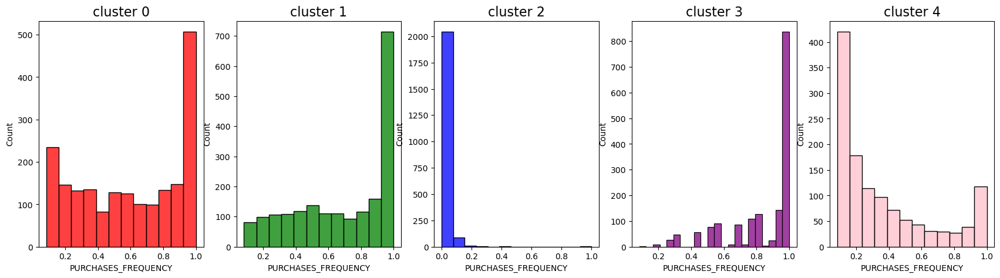

In [41]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['PURCHASES_FREQUENCY'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['PURCHASES_FREQUENCY'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['PURCHASES_FREQUENCY'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['PURCHASES_FREQUENCY'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['PURCHASES_FREQUENCY'], color='pink')
plt.title('cluster 4', size = 16)
plt.show()

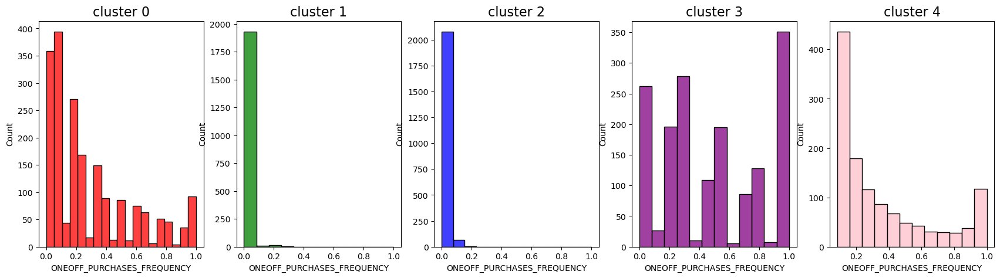

In [42]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['ONEOFF_PURCHASES_FREQUENCY'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['ONEOFF_PURCHASES_FREQUENCY'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['ONEOFF_PURCHASES_FREQUENCY'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['ONEOFF_PURCHASES_FREQUENCY'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['ONEOFF_PURCHASES_FREQUENCY'], color='pink')
plt.title('cluster 4', size = 16)
plt.show()

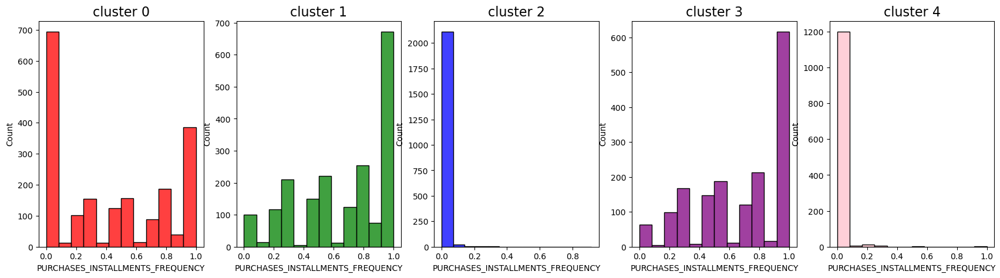

In [43]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['PURCHASES_INSTALLMENTS_FREQUENCY'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['PURCHASES_INSTALLMENTS_FREQUENCY'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['PURCHASES_INSTALLMENTS_FREQUENCY'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['PURCHASES_INSTALLMENTS_FREQUENCY'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['PURCHASES_INSTALLMENTS_FREQUENCY'], color='pink')
plt.title('cluster 4', size = 16)
plt.show()

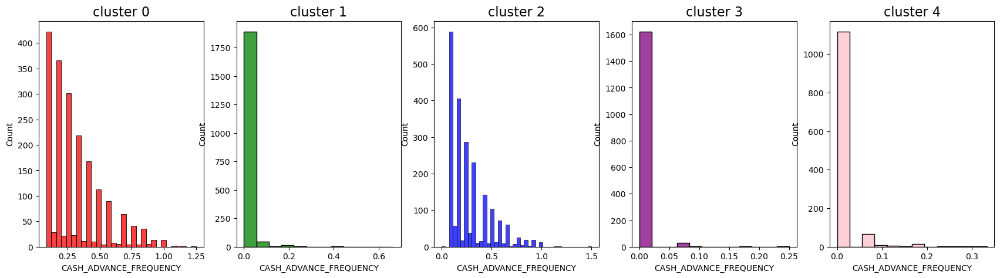

In [44]:
plt.figure(figsize=(21,5))
plt.subplot(1,5,1)
sns.histplot(cluster_0['CASH_ADVANCE_FREQUENCY'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,5,2)
sns.histplot(cluster_1['CASH_ADVANCE_FREQUENCY'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,5,3)
sns.histplot(cluster_2['CASH_ADVANCE_FREQUENCY'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,5,4)
sns.histplot(cluster_3['CASH_ADVANCE_FREQUENCY'], color='purple')
plt.title('cluster 3', size = 16)
plt.subplot(1,5,5)
sns.histplot(cluster_4['CASH_ADVANCE_FREQUENCY'], color='pink')
plt.title('cluster 4', size = 16)
plt.show()

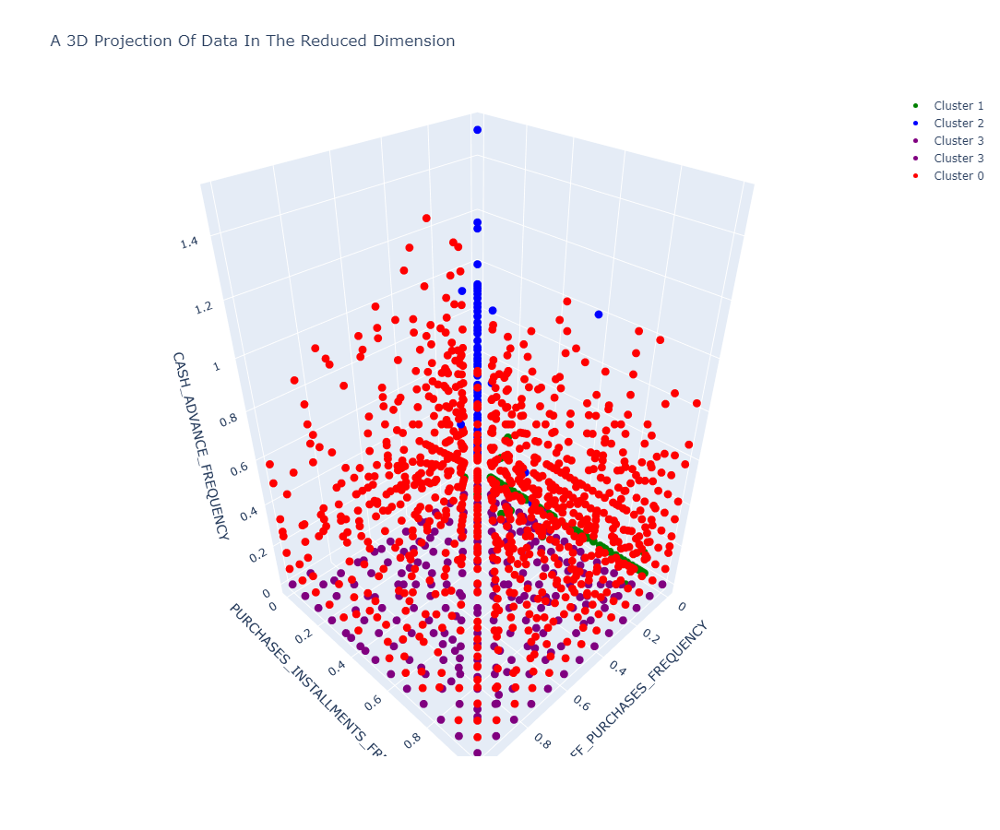

In [45]:
fig = go.Figure()

def cluster3d(cluster, color):
    fig.add_trace(go.Scatter3d(
        x=df[df.cluster_id == cluster]['ONEOFF_PURCHASES_FREQUENCY'],
        y=df[df.cluster_id == cluster]['PURCHASES_INSTALLMENTS_FREQUENCY'],
        z=df[df.cluster_id == cluster]['CASH_ADVANCE_FREQUENCY'],
        mode='markers',
        name=f'Cluster {cluster}',
        marker_color=color,
        marker_size=5))


for C in list(df.cluster_id.unique()):
    if C == 0:
        cluster3d(0, 'red')
    elif C == 1:
        cluster3d(1, 'green')
    elif C == 2:
        cluster3d(2, 'blue')
    elif C == 3:
        cluster3d(3, 'purple')
    elif C == 4:
        cluster3d(3, 'purple')

fig.update_layout(height=900, width=1100,
                  scene=dict(
                      xaxis_title='ONEOFF_PURCHASES_FREQUENCY',
                      yaxis_title='PURCHASES_INSTALLMENTS_FREQUENCY',
                      zaxis_title='CASH_ADVANCE_FREQUENCY'),
                  title_text='A 3D Projection Of Data In The Reduced Dimension')
fig.show()

In [46]:
cluster_0[['BALANCE','PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']].describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,1972.0,2831.917900,2553.051298,19.125876,981.738101,2009.565102,4007.394956,16304.88925
PURCHASES,1972.0,1272.758950,2041.655929,44.700000,281.610000,667.195000,1523.687500,49039.57000
ONEOFF_PURCHASES,1972.0,795.614452,1663.567194,0.000000,80.225000,320.000000,943.285000,40761.25000
INSTALLMENTS_PURCHASES,1972.0,477.324888,845.686910,0.000000,0.000000,201.380000,600.415000,14686.10000
CASH_ADVANCE,1972.0,2281.813757,2859.692106,14.222216,577.457373,1406.214420,2943.282465,47137.21176
CREDIT_LIMIT,1972.0,5384.980279,3903.332751,300.000000,2500.000000,4500.000000,7500.000000,30000.00000
PAYMENTS,1972.0,2574.286530,3627.187159,0.000000,734.508816,1489.557836,2974.883859,46930.59824


**Cluster 0**
* BALANCE: High average balance (2831.92), suggesting users who maintain significant outstanding balances.
* PURCHASES: Moderate purchases (1272.76), with a substantial amount in one-off purchases (795.61).
* INSTALLMENTS_PURCHASES: Moderate (477.32), indicating some preference for installment purchases.
* CASH_ADVANCE: High (2281.81), indicating a frequent use of cash advances.
* CREDIT_LIMIT: High (5384.98), suggesting that these users are trusted with higher credit limits.
* PAYMENTS: High payments (2574.29), which align with their high balances and purchases.
 
**Characteristics:**

* Likely to be high spenders with significant revolving balances.
* Frequently use cash advances.
* Trusted with higher credit limits, indicating good creditworthiness.
* Make substantial payments, possibly to manage high balances.

In [47]:
cluster_1[['BALANCE','PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']].describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,1956.0,382.621173,806.518642,0.00,18.594894,56.375895,301.383009,11416.647360
PURCHASES,1956.0,500.880363,638.299832,0.01,155.720000,316.490000,581.227500,12375.000000
ONEOFF_PURCHASES,1956.0,2.581692,13.960940,0.00,0.000000,0.000000,0.000000,168.710000
INSTALLMENTS_PURCHASES,1956.0,499.227132,641.901880,0.00,150.800000,311.980000,583.522500,12375.000000
CASH_ADVANCE,1956.0,6.142557,46.495261,0.00,0.000000,0.000000,0.000000,879.373487
CREDIT_LIMIT,1956.0,3098.866761,2673.683288,300.00,1200.000000,2500.000000,4000.000000,21500.000000
PAYMENTS,1956.0,725.110741,1258.783902,0.00,209.429646,418.154012,811.932150,28988.973880


**Cluster 1**
* BALANCE: Low average balance (382.62), indicating users who pay off their balances regularly.
* PURCHASES: Moderate (500.88), primarily through installments (499.23).
* ONEOFF_PURCHASES: Very low (2.58), suggesting little to no one-off purchases.
* CASH_ADVANCE: Negligible (6.14), indicating they do not rely on cash advances.
* CREDIT_LIMIT: Moderate (3098.87), suggesting a mid-range trust level by the issuer.
* PAYMENTS: Low (725.11), indicating consistent payments to cover moderate spending.
  
**Characteristics:**

* Prefer installment purchases over one-off purchases.
* Maintain low balances, likely pay off their credit regularly.
* Rarely use cash advances.
* Moderate credit limit, indicating average risk and trust level.

In [48]:
cluster_2[['BALANCE','PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']].describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,2148.0,2130.751143,2109.813703,0.0,734.322633,1438.007828,2819.867081,14581.45914
PURCHASES,2148.0,1.613040,8.432558,0.0,0.000000,0.000000,0.000000,100.00000
ONEOFF_PURCHASES,2148.0,0.984986,6.395209,0.0,0.000000,0.000000,0.000000,100.00000
INSTALLMENTS_PURCHASES,2148.0,0.668534,5.802469,0.0,0.000000,0.000000,0.000000,85.92000
CASH_ADVANCE,2148.0,1970.127929,2479.734845,0.0,370.061392,1188.169271,2652.621151,26194.04954
CREDIT_LIMIT,2147.0,4005.925110,3264.326318,50.0,1500.000000,3000.000000,6000.000000,19000.00000
PAYMENTS,2148.0,1653.434745,2752.328197,0.0,357.701382,751.026114,1720.051389,34107.07499


**Cluster 2**
* BALANCE: Moderate (2130.75), suggesting users with a manageable balance.
* PURCHASES: Very low (1.61), indicating minimal spending.
* ONEOFF_PURCHASES & INSTALLMENTS_PURCHASES: Very low, indicating little to no spending on these categories.
* CASH_ADVANCE: High (1970.13), indicating reliance on cash advances.
* CREDIT_LIMIT: Moderate (4005.93), suggesting a mid-level trust from the issuer.
* PAYMENTS: Moderate (1653.43), indicating they make payments regularly but may use the card less for purchases
  
**Characteristics:**
* Minimal spending on purchases, both one-off and installments.
* Heavy reliance on cash advances, possibly for liquidity.
* Moderate credit limit, indicating average risk and trust.
* Regular payments, likely covering cash advances and moderate balance.

In [49]:
cluster_3[['BALANCE','PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']].describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,1654.0,1315.946408,1909.483374,0.00,206.792094,598.733961,1620.578409,19043.138560
PURCHASES,1654.0,2714.540599,3667.786781,118.72,889.745000,1697.085000,3087.557500,41050.400000
ONEOFF_PURCHASES,1654.0,1651.925865,2893.903144,0.00,331.067500,867.640000,1937.935000,40624.060000
INSTALLMENTS_PURCHASES,1654.0,1062.644359,1518.428410,0.00,278.160000,604.395000,1297.195000,22500.000000
CASH_ADVANCE,1654.0,1.613211,16.361639,0.00,0.000000,0.000000,0.000000,469.074937
CREDIT_LIMIT,1654.0,5862.987798,4019.860704,300.00,2900.000000,5000.000000,7500.000000,30000.000000
PAYMENTS,1654.0,2475.035657,3397.599289,0.00,790.721513,1457.368405,2821.640090,36066.750680


**Cluster 3**
* BALANCE: Moderate (1315.95), indicating users with a manageable balance.
* PURCHASES: High (2714.54), with substantial one-off purchases (1651.93).
* INSTALLMENTS_PURCHASES: High (1062.64), indicating a preference for installment purchases.
* CASH_ADVANCE: Negligible (1.61), suggesting they do not rely on cash advances.
* CREDIT_LIMIT: High (5862.99), indicating high trust from the issuer.
* PAYMENTS: High (2475.04), suggesting significant financial activity and responsible payment behavior.
  
**Characteristics:**
* High spenders, with a preference for both one-off and installment purchases.
* Do not rely on cash advances.
* High credit limit, indicating high creditworthiness.
* Significant financial activity with high payments, suggesting good financial management.

In [50]:
cluster_4[['BALANCE','PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']].describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,1220.0,750.550640,1135.625101,0.00,50.285751,256.873385,1095.514031,12323.845360
PURCHASES,1220.0,816.201361,1256.949364,4.99,145.500000,411.315000,991.267500,17945.000000
ONEOFF_PURCHASES,1220.0,814.681844,1257.564612,4.99,143.040000,411.690000,991.267500,17945.000000
INSTALLMENTS_PURCHASES,1220.0,1.830074,10.329448,0.00,0.000000,0.000000,0.000000,119.600000
CASH_ADVANCE,1220.0,12.001511,57.332484,0.00,0.000000,0.000000,0.000000,900.547414
CREDIT_LIMIT,1220.0,4296.852956,3607.559319,150.00,1500.000000,3000.000000,6000.000000,25000.000000
PAYMENTS,1220.0,1124.213951,2194.561592,0.00,281.883560,554.091044,1218.080950,50721.483360


**Cluster 4**
* BALANCE: Low (750.55), suggesting users who likely pay off their balances regularly.
* PURCHASES: Moderate (816.20), with significant one-off purchases (814.68).
* INSTALLMENTS_PURCHASES: Very low (1.83), indicating a preference for one-off purchases.
* CASH_ADVANCE: Very low (12.00), indicating they do not rely on cash advances.
* CREDIT_LIMIT: Moderate (4296.85), indicating average trust from the issuer.
* PAYMENTS: Moderate (1124.21), suggesting regular and consistent payment behavior.
  
**Characteristics:**
* Prefer one-off purchases over installments.
* Maintain low balances, likely pay off their credit regularly.
* Rarely use cash advances.
* Moderate credit limit, indicating average risk and trust.
* Consistent payment behavior, covering moderate spending.

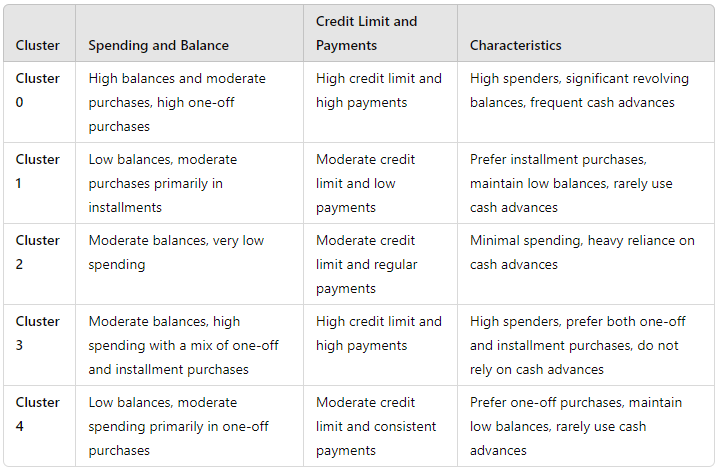

# 7 . Summary and Recommendations

* **Cluster 0**: High spenders with significant balances and frequent cash advances. Consider offering tailored financial products like balance transfer options or lower interest rates on cash advances to manage high balances.

* **Cluster 1**: Regular payers with moderate purchases primarily in installments. Offer loyalty programs and installment purchase benefits to encourage continued spending.

* **Cluster 2**: Minimal spenders relying heavily on cash advances. Offer financial advice or products to reduce dependence on cash advances, such as personal loans with lower interest rates.

* **Cluster 3**: High spenders with a balanced approach to one-off and installment purchases. Provide premium rewards programs and higher credit limits to encourage their spending habits.

* **Cluster 4**: Low balance maintainers with a preference for one-off purchases. Offer cashback rewards on purchases and personalized offers to maintain engagement.

In [51]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster_id
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,4
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12,4
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,4
